# Advanced Lan Finding


## The goals / steps of this project are the following
***

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
   The images for camera calibration are stored in the folder called camera_cal. The images in test_images are for   testing your pipeline on single frames. If you want to extract more test images from the videos, you can simply     use an image writing method like cv2.imwrite(), i.e., you can read the video in frame by frame as usual, and for   frames you want to save for later you can write to an image file.

To help the reviewer examine your work, please save examples of the output from each stage of your pipeline in the folder called ouput_images, and include a description in your writeup for the project of what each image shows. The video called project_video.mp4 is the video your pipeline should work well on.

The challenge_video.mp4 video is an extra (and optional) challenge for you if you want to test your pipeline under somewhat trickier conditions. The harder_challenge.mp4 video is another optional challenge and is brutal!

If you're feeling ambitious (again, totally optional though), don't stop there! We encourage you to go out and take video of your own, calibrate your camera and show us how you would implement this project from scratch!

## 0. Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline
import os
import glob

## 1. Camera Calibration
Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

### 1.1 Read Chess Board images

Chessboard Images


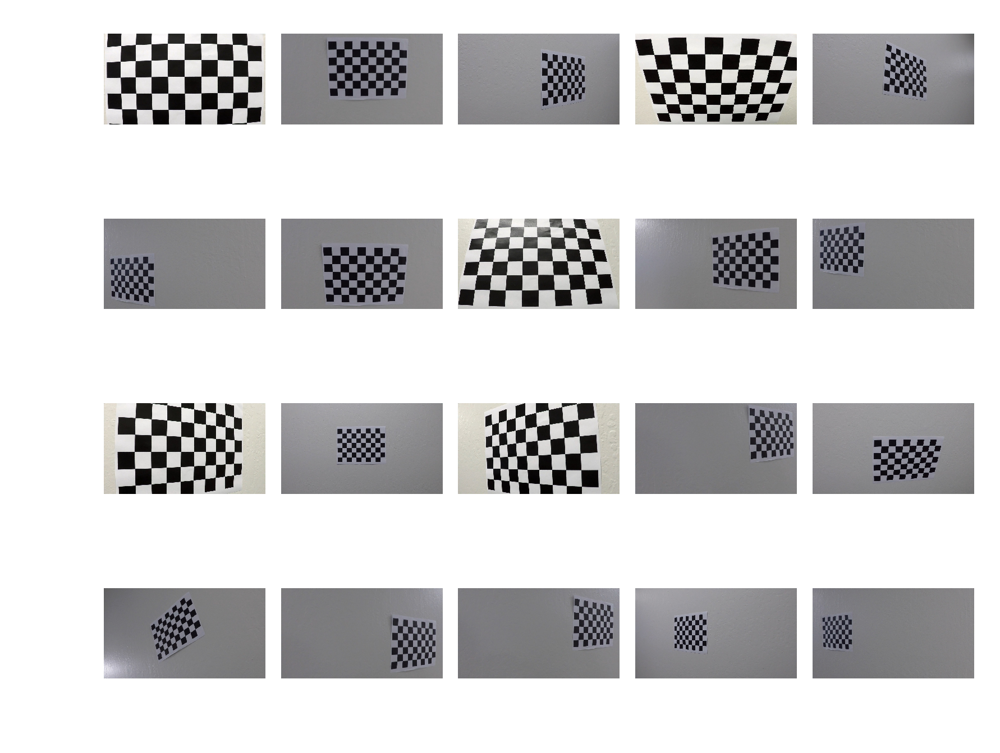

In [2]:
#####
# Reading chessboard image
chessboard_file_list = glob.glob(os.path.join("./camera_cal", '*.jpg'))
num_chessboard_file = len(chessboard_file_list)
#print(chessboard_file_list)
chessboard_img=[]
for f in chessboard_file_list:
    img = mpimg.imread(f)
    chessboard_img.append(img)

#####
# Visualizing chessboard images
print("Chessboard Images")
rows=4
cols=5
fig, ax = plt.subplots(rows, cols, figsize=(cols, rows), dpi=400)
fig.subplots_adjust(hspace = .5, wspace=.1)
for i in range(rows):
    for k in range(cols):
        ax[i][k].set_axis_off()
        if (i*cols+k)<num_chessboard_file:
            ax[i][k].imshow(chessboard_img[i*cols+k])
plt.show()
plt.close()



#define number of points which are already known values
nx = 9
ny = 6




### 1.2. Calibrate camera

Chessboard Images with Corners


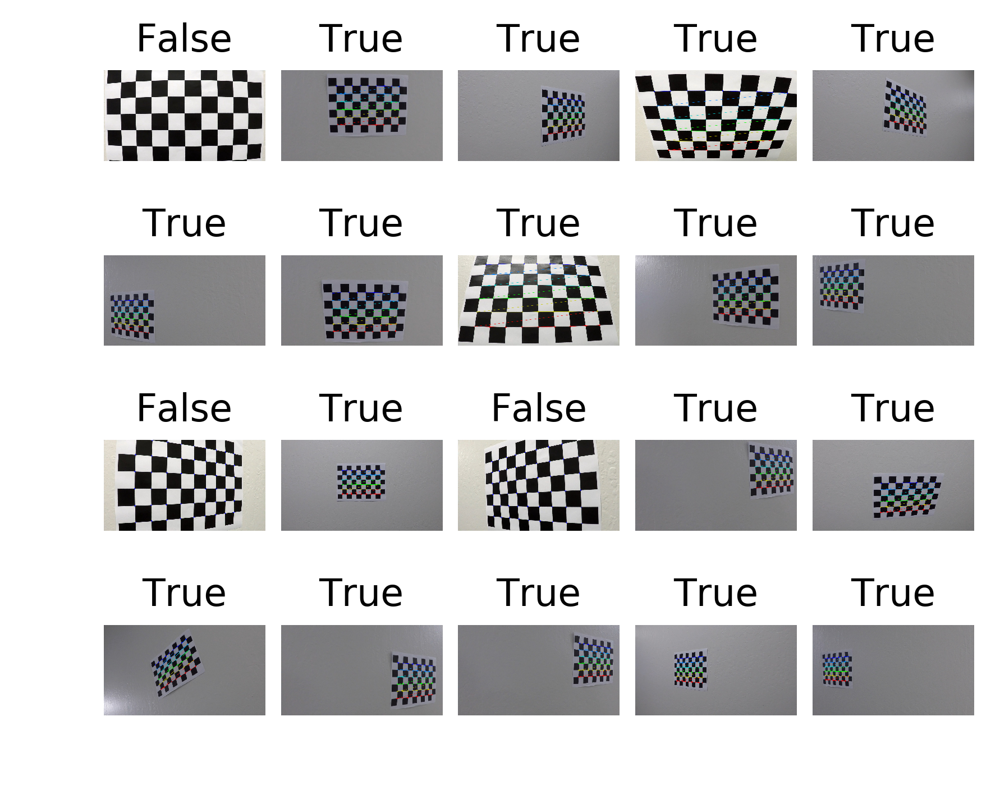

In [3]:
#####
# Finding image points and object points in gray scale images 
chessboard_img_gray=[]
chessboard_img_corners=[]
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
obj_points=[]
img_points=[]
corner_find_results=[]
#print(objp)
for i in range(num_chessboard_file):
    # convert to gray scale
    gray=cv2.cvtColor(chessboard_img[i], cv2.COLOR_RGB2GRAY)
    chessboard_img_gray.append(gray)
    
    # find corners 
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    corner_img = cv2.drawChessboardCorners(chessboard_img[i], (nx,ny), corners, ret)
    chessboard_img_corners.append(corner_img)
    corner_find_results.append(ret)
    
    # save img points & obj points
    if(ret==True):
        obj_points.append(objp)
        img_points.append(corners)

#####
# Visualizing chessboard images with corners 
print("Chessboard Images with Corners")
rows=4
cols=5
fig, ax = plt.subplots(rows, cols, figsize=(cols, rows), dpi=400)
fig.subplots_adjust(hspace = .5, wspace=.1)
for i in range(rows):
    for k in range(cols):
        ax[i][k].set_axis_off()
        if (i*cols+k)<len(chessboard_img_corners):
            ax[i][k].set_title(corner_find_results[i*cols+k])
            ax[i][k].imshow(chessboard_img_corners[i*cols+k])
plt.show()
plt.close()

#####
# Find out camera matrix and distortion coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, chessboard_img_gray[0].shape[::-1], None, None)


## 2. Apply a distortion correction to raw images.

Chessboard Image Example


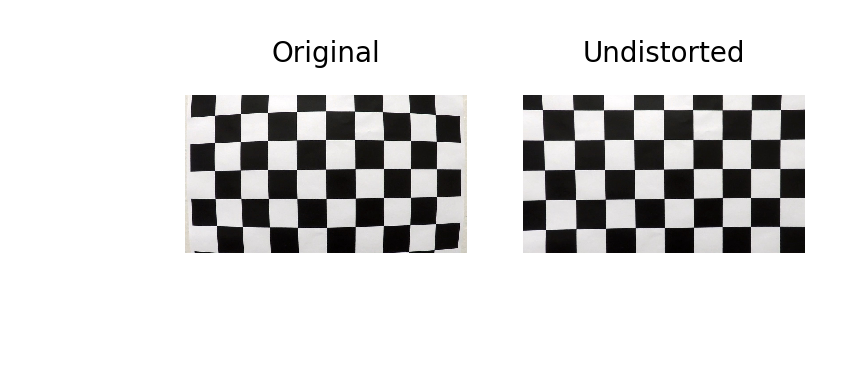

Test Image : ./test_images/test6.jpg


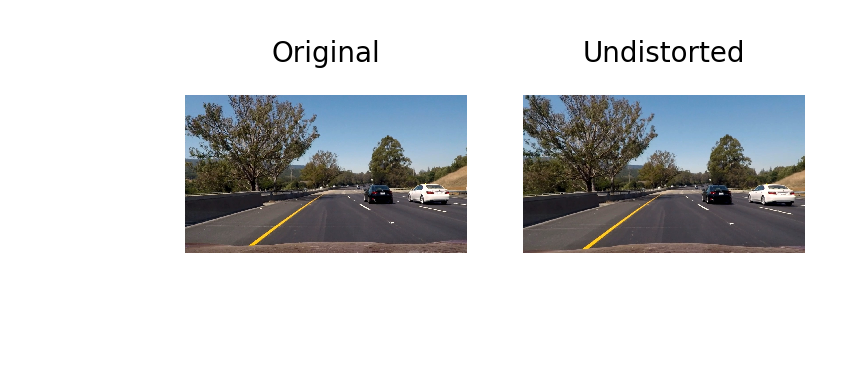

Test Image : ./test_images/test4.jpg


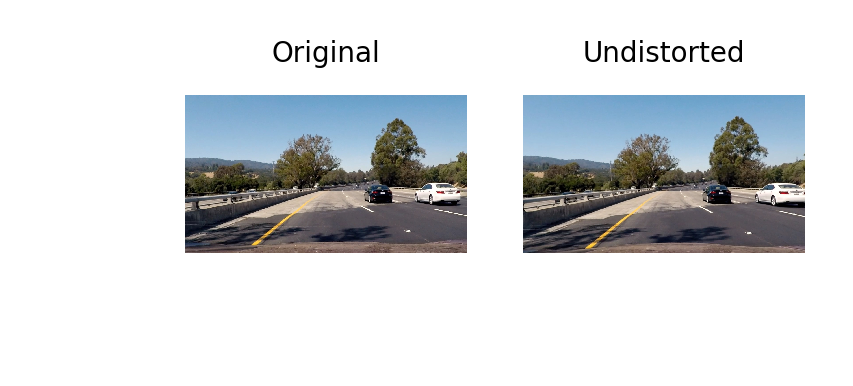

Test Image : ./test_images/test5.jpg


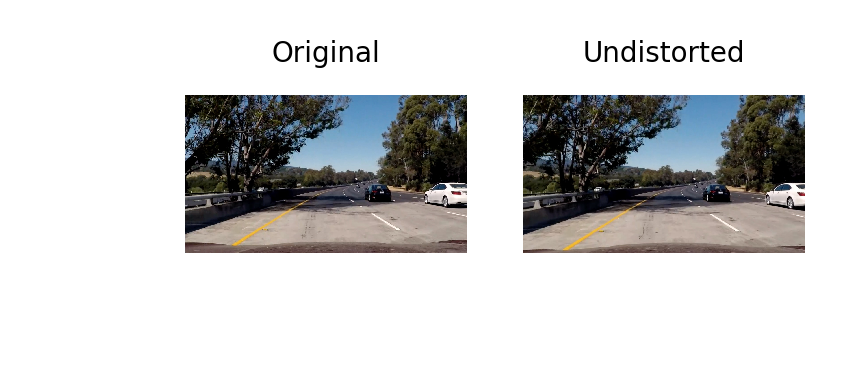

Test Image : ./test_images/test1.jpg


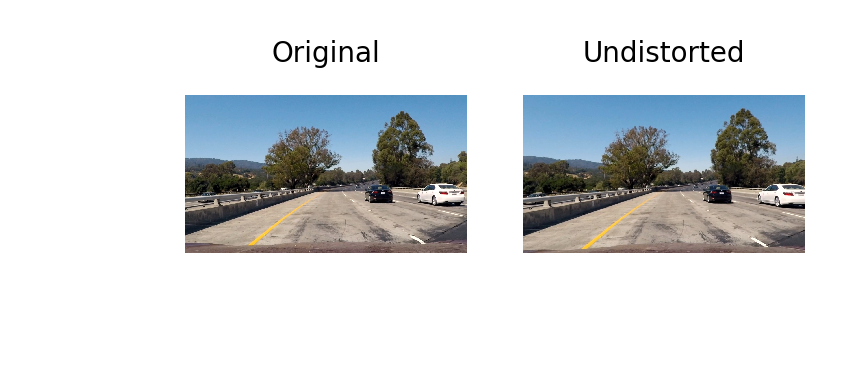

Test Image : ./test_images/straight_lines2.jpg


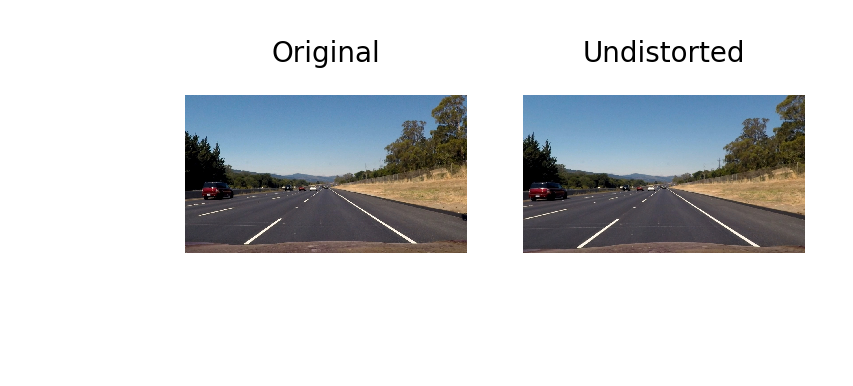

Test Image : ./test_images/straight_lines1.jpg


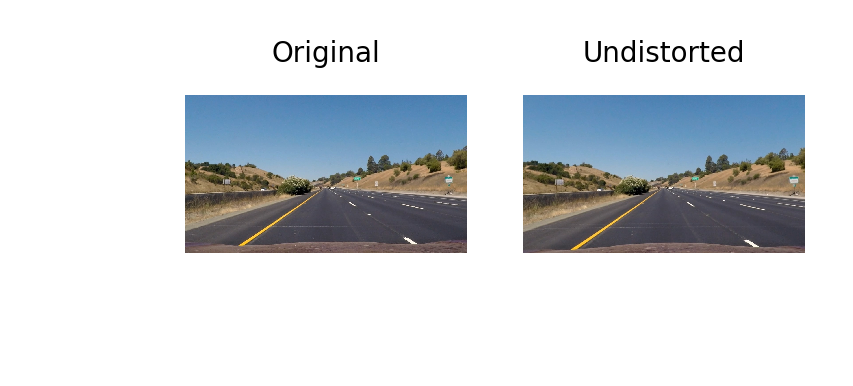

Test Image : ./test_images/test3.jpg


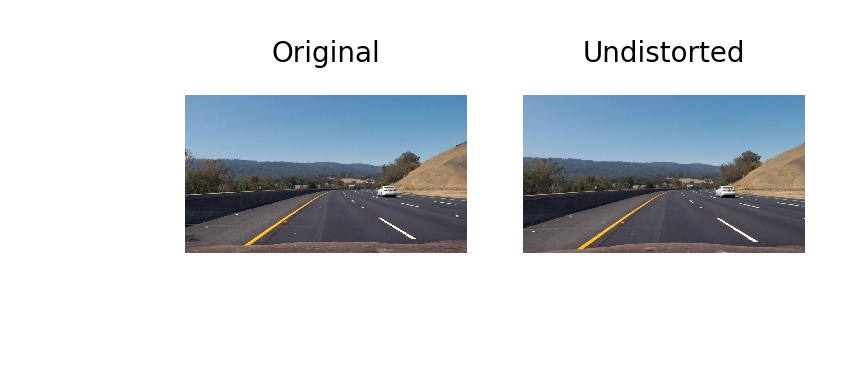

Test Image : ./test_images/test2.jpg


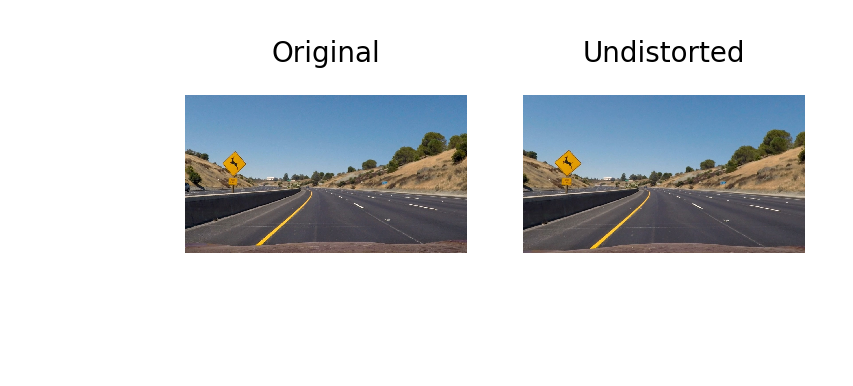

In [4]:
#####
# Read test images
test_file_list = glob.glob(os.path.join("./test_images", '*.jpg'))
num_test_file = len(test_file_list)
#print(test_file_list)
test_img=[]
for f in test_file_list:
    img = mpimg.imread(f)
    test_img.append(img)

#####
# Undistort images
def undistort_img(img, mtx=mtx, dist=dist, display=False):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    if display==True:
        rows=1
        cols=2
        fig, ax = plt.subplots(rows, cols, figsize=(cols, rows), dpi=400)
        ax[0].set_axis_off()
        ax[0].set_title("Original", fontsize=5)
        ax[0].imshow(img)
        ax[1].set_axis_off()
        ax[1].set_title("Undistorted", fontsize=5)
        ax[1].imshow(dst)
        plt.show()
    return dst

# First, Try on a chessboard image
print("Chessboard Image Example")
undistort_img(chessboard_img[0], display=True)

# Try on test images
for i in range(num_test_file):
    print("Test Image : {}".format(test_file_list[i]))
    undistort_img(test_img[i], display=True)
    


## 3. Thresholded binary image

### 3.1. Visualize Color Transforms

Original Image


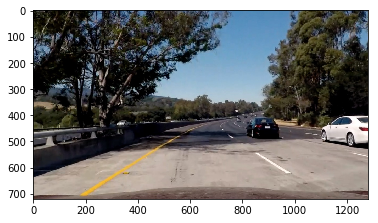

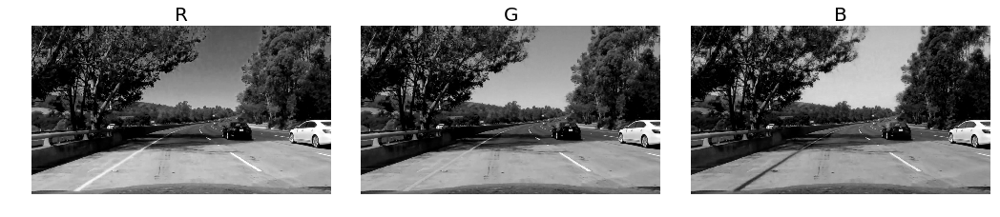

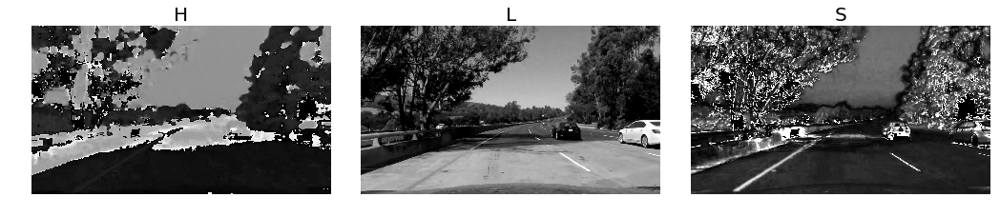

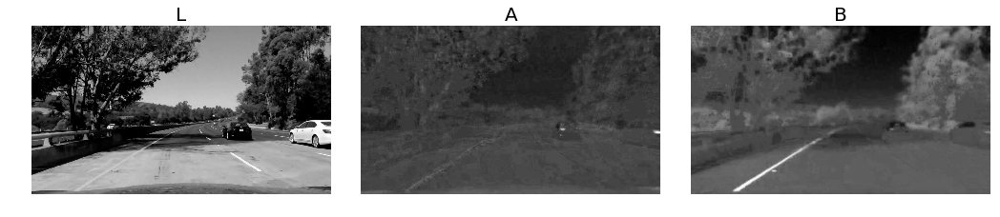

In [5]:
transform_img = undistort_img(test_img[2]) #RGB
print("Original Image")
plt.imshow(transform_img)

#####
# RGB
RGB_R = transform_img[:,:,0]
RGB_G = transform_img[:,:,1]
RGB_B = transform_img[:,:,2]

rows=1
cols=3
fig, ax = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
fig.subplots_adjust(hspace = .2, wspace=.1)
ax[0].set_axis_off()
ax[0].set_title("R", fontsize=20)
ax[0].imshow(RGB_R, cmap='gray')
ax[1].set_axis_off()
ax[1].set_title("G", fontsize=20)
ax[1].imshow(RGB_G, cmap='gray')
ax[2].set_axis_off()
ax[2].set_title("B", fontsize=20)
ax[2].imshow(RGB_B, cmap='gray')
plt.show()

#####
# HLS
transform_img_HLS = cv2.cvtColor(transform_img, cv2.COLOR_RGB2HLS)
HLS_H = transform_img_HLS[:,:,0]
HLS_L = transform_img_HLS[:,:,1]
HLS_S = transform_img_HLS[:,:,2]

rows=1
cols=3
fig, ax = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
fig.subplots_adjust(hspace = .2, wspace=.1)
ax[0].set_axis_off()
ax[0].set_title("H", fontsize=20)
ax[0].imshow(HLS_H, cmap='gray')
ax[1].set_axis_off()
ax[1].set_title("L", fontsize=20)
ax[1].imshow(HLS_L, cmap='gray')
ax[2].set_axis_off()
ax[2].set_title("S", fontsize=20)
ax[2].imshow(HLS_S, cmap='gray')
plt.show()


#####
# LAB
transform_img_LAB = cv2.cvtColor(transform_img, cv2.COLOR_RGB2LAB)
LAB_L = transform_img_LAB[:,:,0]
LAB_A = transform_img_LAB[:,:,1]
LAB_B = transform_img_LAB[:,:,2]

rows=1
cols=3
fig, ax = plt.subplots(rows, cols, figsize=(cols*6, rows*6))
fig.subplots_adjust(hspace = .2, wspace=.1)
ax[0].set_axis_off()
ax[0].set_title("L", fontsize=20)
ax[0].imshow(LAB_L, cmap='gray')
ax[1].set_axis_off()
ax[1].set_title("A", fontsize=20)
ax[1].imshow(LAB_A, cmap='gray')
ax[2].set_axis_off()
ax[2].set_title("B", fontsize=20)
ax[2].imshow(LAB_B, cmap='gray')
plt.show()


### 3.2. Color Thresholding
 As seeing each channel of the image, the combination of 'R' in RGB, 'S' in HLS and 'B' in LAB show great difference of lanes.




 Input


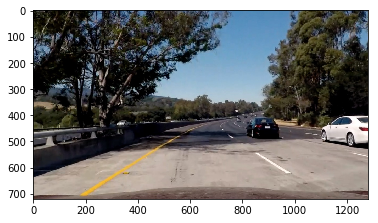

Color thresholding


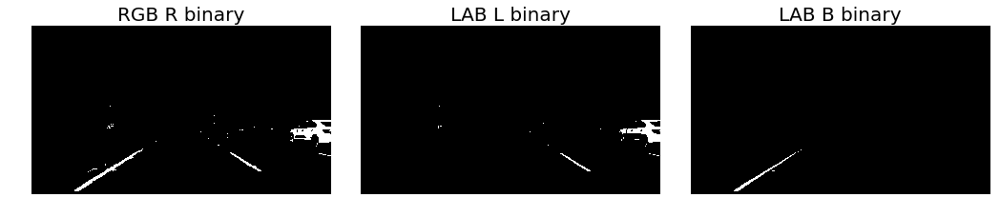

Combined output


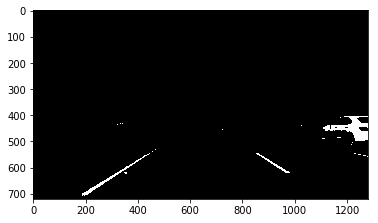




 Input


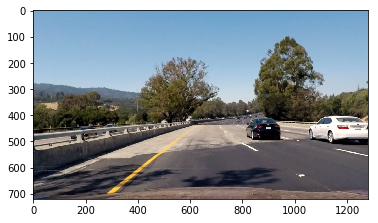

Color thresholding


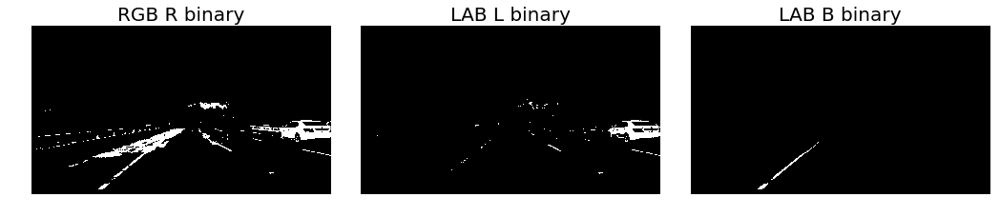

Combined output


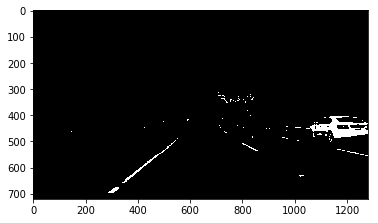

In [49]:
#####
# color thresholding function

#def color_thresholding(rgb_img, thres_r=(205, 255), thres_b=(140,255), thres_l=(200, 255), display=False):
def color_thresholding(rgb_img, thres_r=(205, 255), thres_b=(180,255), thres_l=(220, 255), display=False):
    r = rgb_img[:,:,0]
    lab_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2LAB)
    l = lab_img[:,:,0]
    b = lab_img[:,:,2]
    
    r_binary = np.zeros_like(r)
    r_binary[(r > thres_r[0]) & (r <= thres_r[1])] = 1
    l_binary = np.zeros_like(l)
    l_binary[(l > thres_l[0]) & (l <= thres_l[1])] = 1
    b_binary = np.zeros_like(b)
    b_binary[(b > thres_b[0]) & (b <= thres_b[1])] = 1
    
    if(display==True):
        print("\n\n\n Input")
        plt.imshow(rgb_img)
        plt.show()
        print("Color thresholding")
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        fig.subplots_adjust(hspace = .2, wspace=.1)
        ax[0].set_axis_off()
        ax[0].set_title("RGB R binary", fontsize=20)
        ax[0].imshow(r_binary, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("LAB L binary", fontsize=20)
        ax[1].imshow(l_binary, cmap='gray')
        ax[2].set_axis_off()
        ax[2].set_title("LAB B binary", fontsize=20)
        ax[2].imshow(b_binary, cmap='gray')
        plt.show()
    
#     combined = r_binary
#     combined[(l_binary==1)|(b_binary==1)]=1
    combined=np.zeros_like(r_binary)
    combined[(l_binary==1)|(b_binary==1)]=1
    if(display==True):
        print("Combined output")
        plt.imshow(combined, cmap='gray')
        plt.show()
    return combined
combined_color = color_thresholding(transform_img, display=True)
combined_color = color_thresholding(undistort_img(test_img[1]), display=True)
                   
                   

### 3.3. Applying Sobel operator

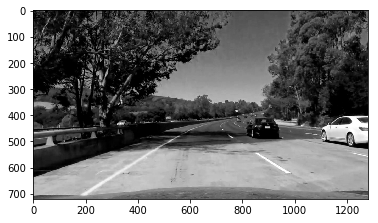

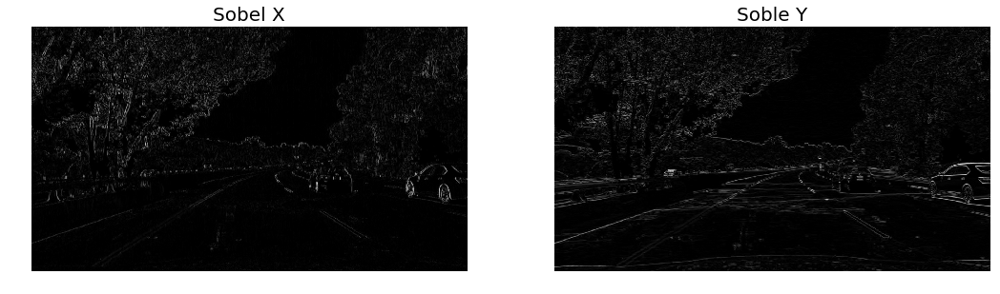

In [7]:
sobel_img = transform_img  # used one in color transform
sobel_img_gray = cv2.cvtColor(sobel_img, cv2.COLOR_RGB2GRAY)
sobel_img_gray = sobel_img[:,:,0]
plt.imshow(sobel_img_gray, cmap='gray')

#####
# Apply Sobel filter
sobelx = cv2.Sobel(sobel_img_gray, cv2.CV_64F, 1, 0)
sobelx = np.absolute(sobelx)
sobelx = np.uint8(255*sobelx/np.max(sobelx))
sobely = cv2.Sobel(sobel_img_gray, cv2.CV_64F, 0, 1)
sobely = np.absolute(sobely)
sobely = np.uint8(255*sobely/np.max(sobely))

#####
# Visualize filtered image
fig, ax = plt.subplots(1, 2, figsize=(18, 6))
ax[0].set_axis_off()
ax[0].set_title("Sobel X", fontsize=20)
ax[0].imshow(sobelx, cmap='gray')
ax[1].set_axis_off()
ax[1].set_title("Soble Y", fontsize=20)
ax[1].imshow(sobely, cmap='gray')
plt.show()


Absolute sobel for 'gray'
Sobel Absolute Threshold


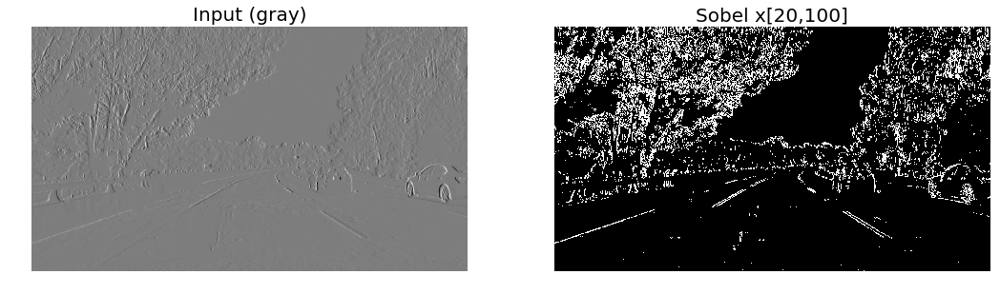

Sobel Absolute Threshold


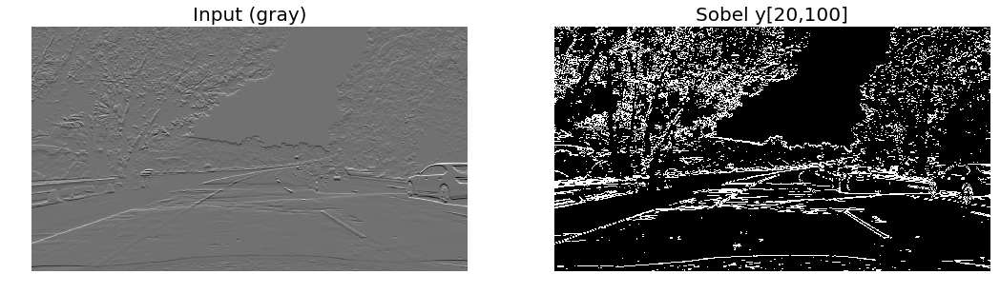

Absolute sobel for 'R'
Sobel Absolute Threshold


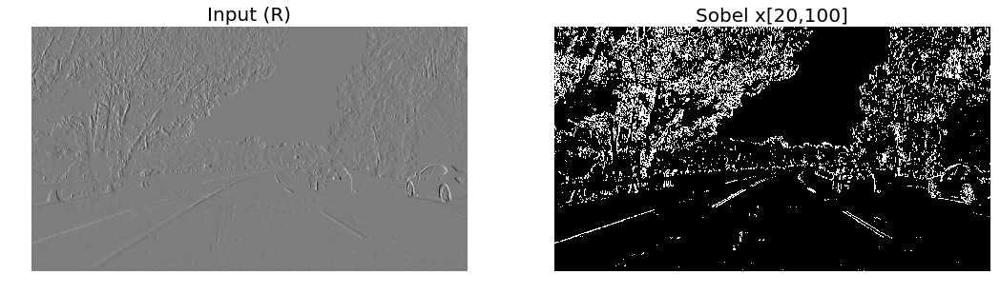

Sobel Absolute Threshold


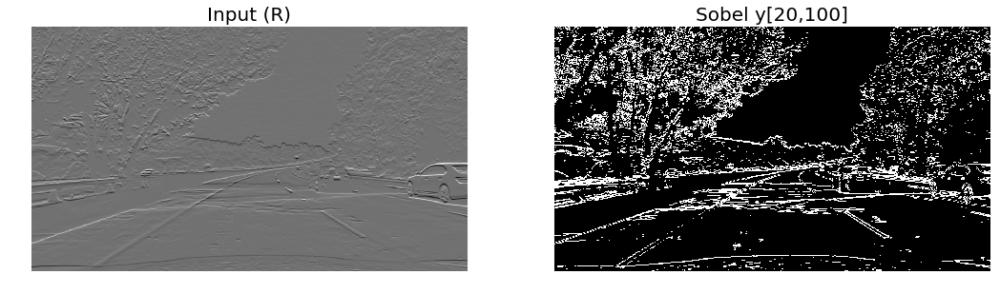

Absolute sobel for 'S'
Sobel Absolute Threshold


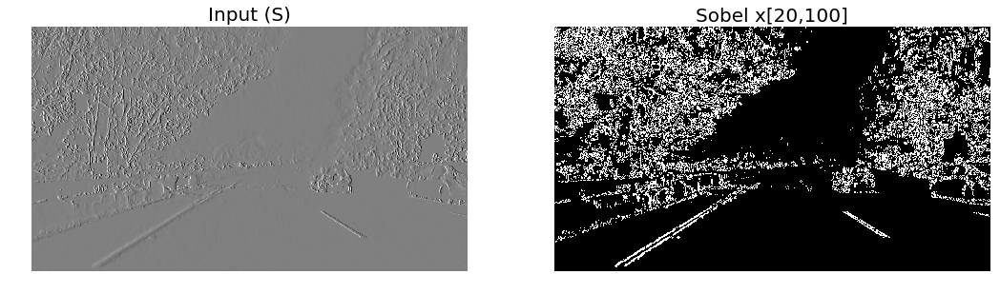

Sobel Absolute Threshold


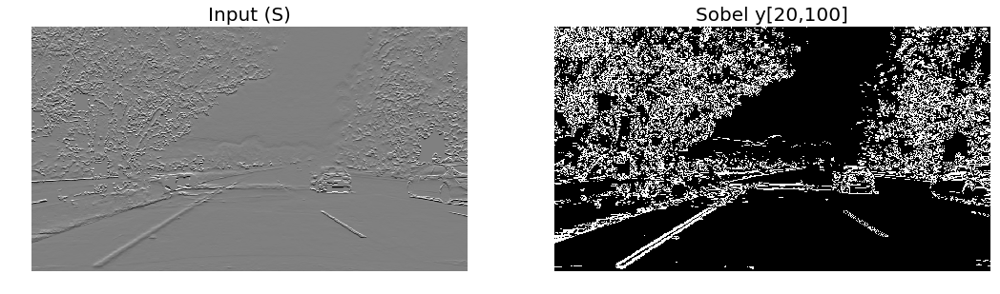

In [8]:

#####
# Absolute Soble Threshold

# format : try Sobel to different color format
#          'gray' : gray
#          'S'    : S of HLS
#          'R'    : R of RGB
def sobel_abs_thresh(img, format='S', orient='x', thresh_min=20, thresh_max=100, display=False):
    if format=='S':
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2] # HLS S
    elif format=='R':
        sobel = img[:,:,0]
    else:
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    dir=0
    if orient=='y':
        dir=1
    sobel = cv2.Sobel(sobel, cv2.CV_64F, (not dir), dir, ksize=5)
    abs_sobel = np.absolute(sobel)
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    if display==True:
        print("Sobel Absolute Threshold")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input ({})".format(format), fontsize=20)
        ax[0].imshow(sobel, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("Sobel "+orient+"[{},{}]".format(thresh_min, thresh_max), fontsize=20)
        ax[1].imshow(sbinary, cmap='gray')
        plt.show()
    return sbinary

print("Absolute sobel for 'gray'")
sbinary_x = sobel_abs_thresh(sobel_img, format='gray', orient='x', display=True)
sbinary_y = sobel_abs_thresh(sobel_img, format='gray', orient='y', display=True)

print("Absolute sobel for 'R'")
sbinary_x = sobel_abs_thresh(sobel_img, format='R', orient='x', display=True)
sbinary_y = sobel_abs_thresh(sobel_img, format='R', orient='y', display=True)

print("Absolute sobel for 'S'")
sbinary_x = sobel_abs_thresh(sobel_img, format='S', orient='x', display=True)
sbinary_y = sobel_abs_thresh(sobel_img, format='S', orient='y', display=True)




Magnitude sobel for 'gray'
Sobel Magnitude Threshold


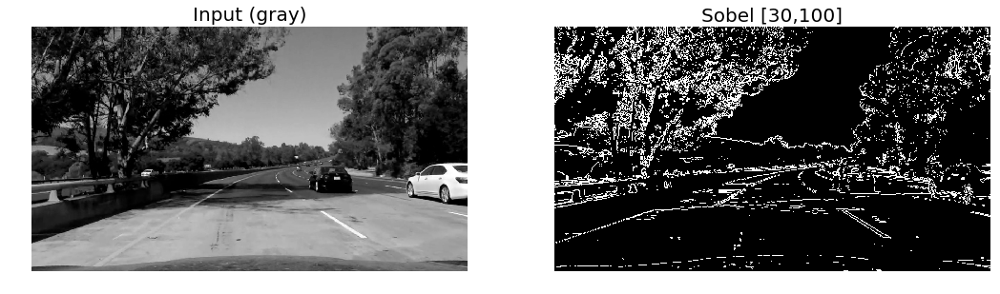

Magnitude sobel for 'R'
Sobel Magnitude Threshold


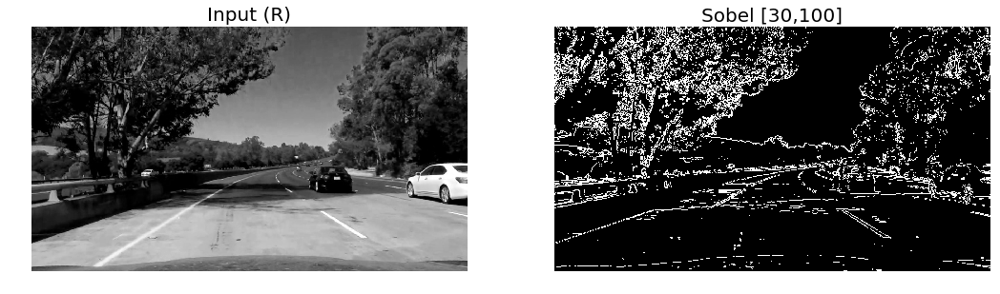

Magnitude sobel for 'S'
Sobel Magnitude Threshold


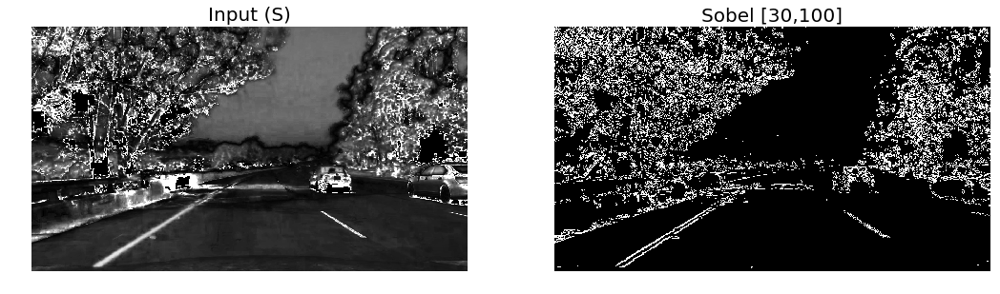

In [18]:
#####
# Sobel Magnitude Threshold


def sobel_mag_thresh(img, format='S', thresh_min=30, thresh_max=100, display=False):
    if format=='S':
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2] # HLS S
    elif format=='R':
        sobel = img[:,:,0]
    else:
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    sobelx = cv2.Sobel(sobel, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(sobel, cv2.CV_64F, 0, 1, ksize=3)
    
    # Calculate the magnitude 
    mag = np.sqrt(sobelx**2 + sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag/np.max(mag))
    
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    if display==True:
        print("Sobel Magnitude Threshold")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input ({})".format(format), fontsize=20)
        ax[0].imshow(sobel, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("Sobel [{},{}]".format(thresh_min, thresh_max), fontsize=20)
        ax[1].imshow(sbinary, cmap='gray')
        plt.show()

    return sbinary


print("Magnitude sobel for 'gray'")
sbinary_mag = sobel_mag_thresh(sobel_img, format='gray', display=True)

print("Magnitude sobel for 'R'")
sbinary_mag = sobel_mag_thresh(sobel_img, format='R', display=True)

print("Magnitude sobel for 'S'")
sbinary_mag = sobel_mag_thresh(sobel_img, format='S', display=True)



Gradient sobel for 'gray'
Sobel Gradient Threshold


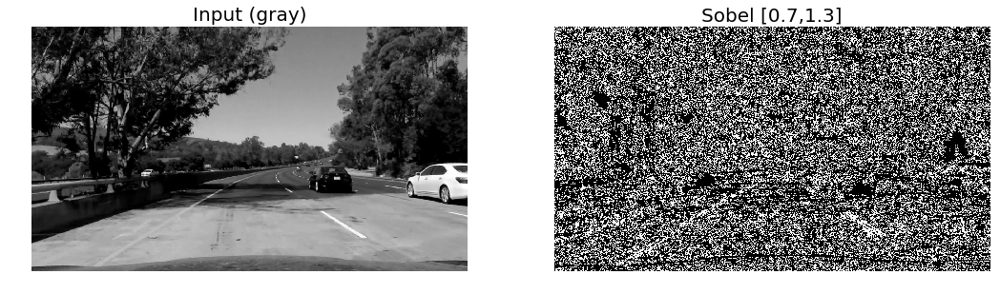

Gradient sobel for 'R'
Sobel Gradient Threshold


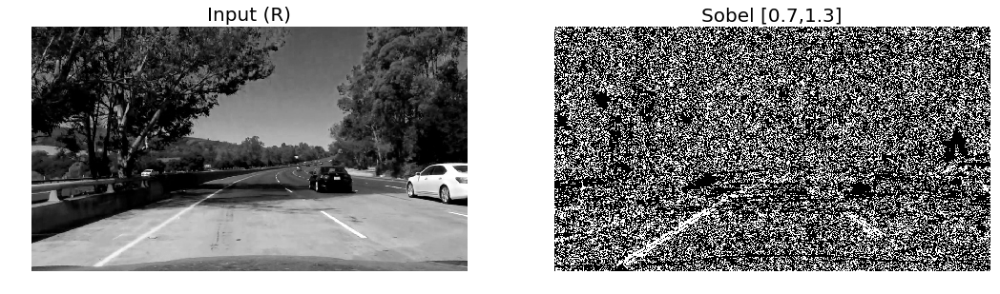

Gradient sobel for 'S'
Sobel Gradient Threshold


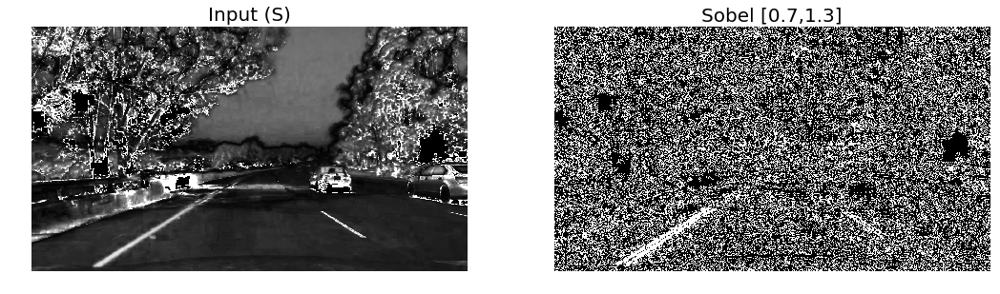

In [19]:
#####
# Sobel Gradient(Direction) Threshold


def sobel_grad_thresh(img, format='S', thresh_min=0.7, thresh_max=1.3, display=False):
    if format=='S':
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2] # HLS S
    elif format=='R':
        sobel = img[:,:,0]
    else:
        sobel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
    sobelx = cv2.Sobel(sobel, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(sobel, cv2.CV_64F, 0, 1, ksize=5)

    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad = np.arctan2(abs_sobely, abs_sobelx)
        
    sbinary = np.zeros_like(grad)
    sbinary[(grad >= thresh_min) & (grad <= thresh_max)] = 1
    
    if display==True:
        print("Sobel Gradient Threshold")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input ({})".format(format), fontsize=20)
        ax[0].imshow(sobel, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("Sobel [{},{}]".format(thresh_min, thresh_max), fontsize=20)
        ax[1].imshow(sbinary, cmap='gray')
        plt.show()

    return sbinary


print("Gradient sobel for 'gray'")
sbinary_grad = sobel_grad_thresh(sobel_img, format='gray', display=True)

print("Gradient sobel for 'R'")
sbinary_grad = sobel_grad_thresh(sobel_img, format='R', display=True)

print("Gradient sobel for 'S'")
sbinary_grad = sobel_grad_thresh(sobel_img, format='S', display=True)

### 3.4. Combine thresholding techniques

Combined binary


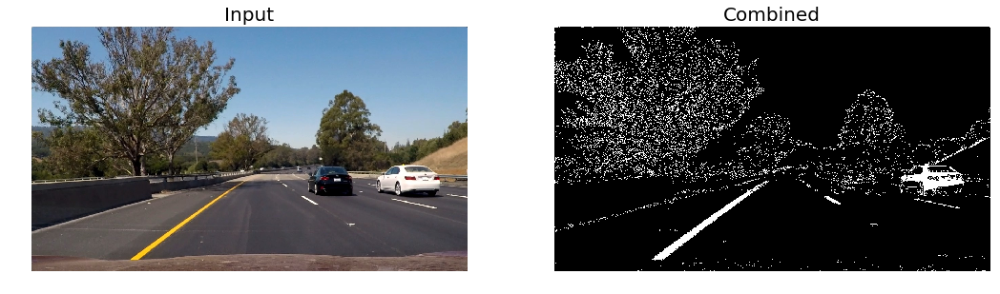

Combined binary


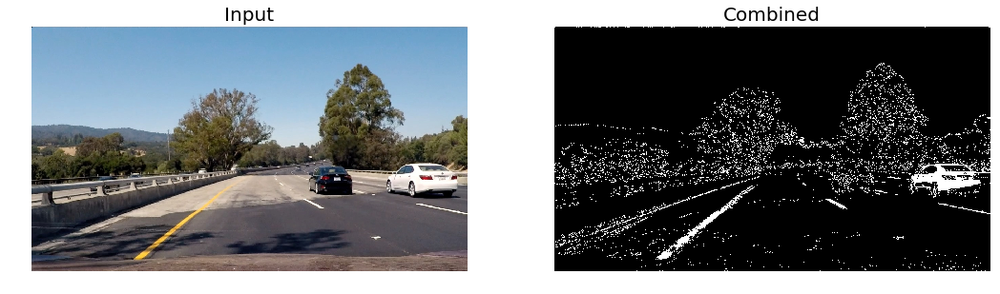

Combined binary


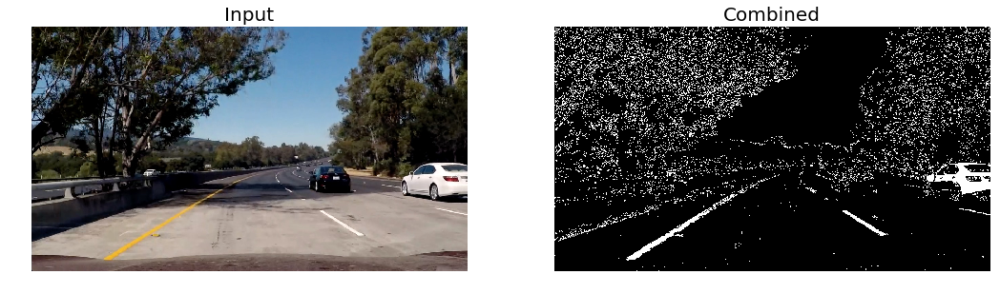

Combined binary


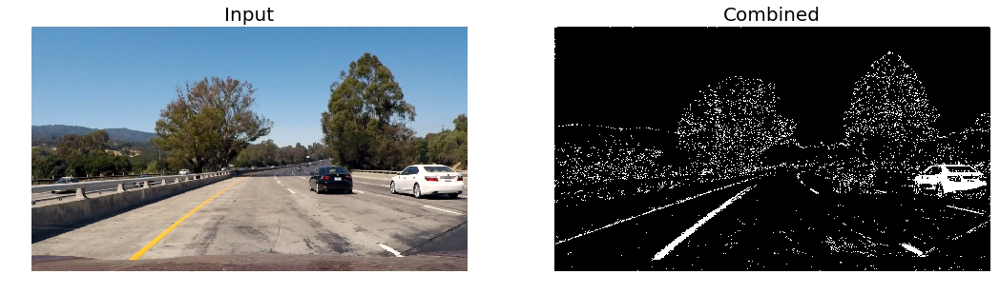

Combined binary


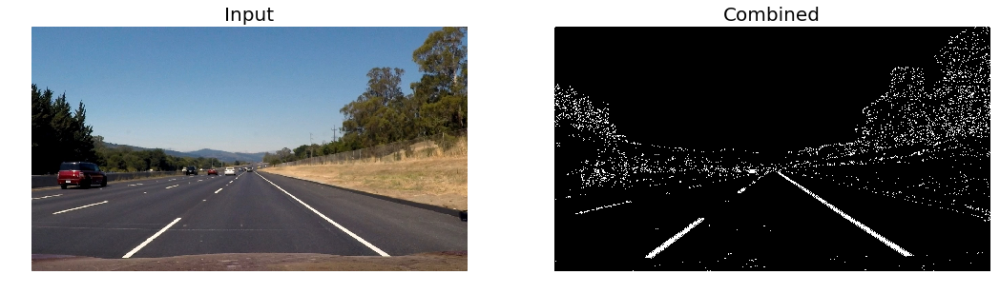

Combined binary


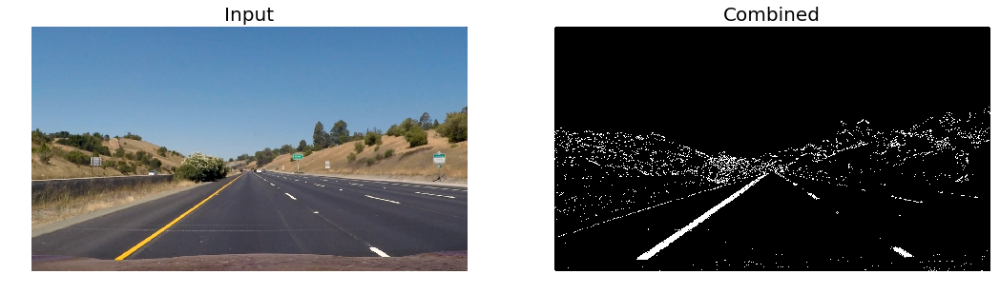

Combined binary


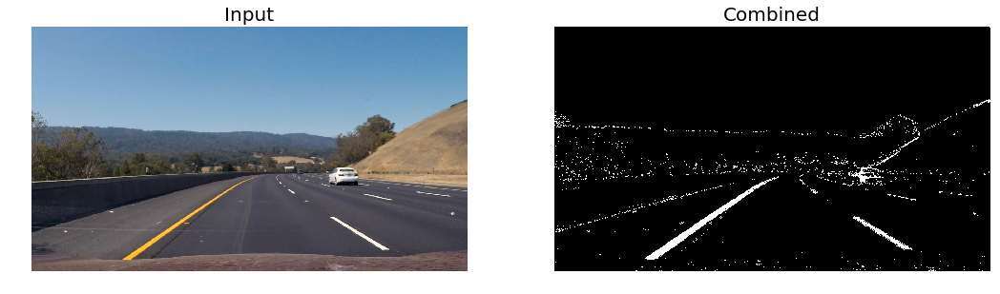

Combined binary


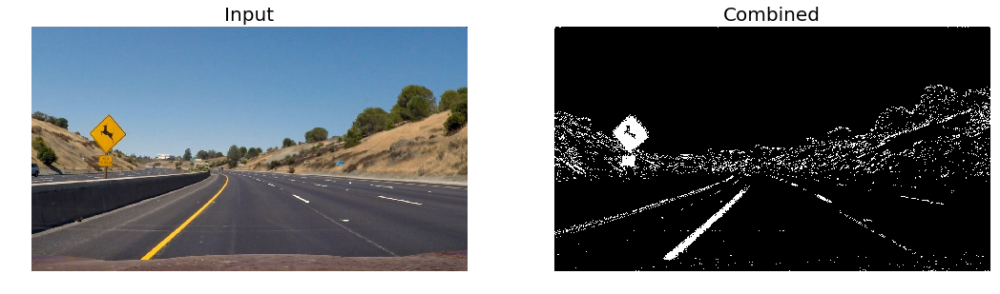

In [54]:
#####
# Combining thresholding techinques

def combined_thresholding(img, display=False):
    combined_color = color_thresholding(img)
    sbinary_x_abs_gray = sobel_abs_thresh(img, format='gray', orient='x')
    sbinary_x_abs_R = sobel_abs_thresh(img, format='R', orient='x')
    sbinary_x_abs_S = sobel_abs_thresh(img, format='S', orient='x')
    sbinary_mag_gray = sobel_mag_thresh(img, format='gray')
    sbinary_mag_R = sobel_mag_thresh(img, format='R')
    sbinary_mag_S = sobel_mag_thresh(img, format='S')
    sbinary_grad_gray = sobel_grad_thresh(img, format='gray')
    sbinary_grad_R = sobel_grad_thresh(img, format='R')
    sbinary_grad_S = sobel_grad_thresh(img, format='S')
    combined_sobel = np.zeros_like(sbinary_x_abs_gray)
    combined_sobel[(((sbinary_x_abs_gray==1)|(sbinary_x_abs_R==1))\
                    | ((sbinary_mag_R==1)|(sbinary_mag_S==1)) )\
                    & ((sbinary_grad_R==1)&(sbinary_grad_R==1)) \
                  ]=1
#     combined_sobel[(((sbinary_x_abs_gray==1))\
#                     | ((sbinary_mag_gray==1)) )\
#                     & ((sbinary_grad_gray==1)) \
#                   ]=1
    
    combined = combined_color | combined_sobel
    if display==True:
        print("Combined binary")
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("Input", fontsize=20)
        ax[0].imshow(img)
        ax[1].set_axis_off()
        ax[1].set_title("Combined", fontsize=20)
        ax[1].imshow(combined, cmap='gray')
        plt.show()
        '''
        print("Combined binary")
        plt.imshow(img)
        plt.show()
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].set_axis_off()
        ax[0].set_title("combined_color".format(format), fontsize=20)
        ax[0].imshow(combined_color, cmap='gray')
        ax[1].set_axis_off()
        ax[1].set_title("combined_sobel", fontsize=20)
        ax[1].imshow(combined_sobel, cmap='gray')
        plt.show()
        print("Combined final")
        plt.imshow(combined, cmap='gray')
        plt.show()
        '''
for img in test_img:
    combined_thresholding(img, display=True)
    



## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [13]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [14]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    result = draw_lane_lines(image)
    return result

Let's try the one with the solid white lane on the right first ...

In [15]:
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
## clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

# video_in_dir = "test_videos/"
# video_out_dir = "test_videos_output/"
# if not os.path.exists(video_out_dir):
#     os.makedirs(video_out_dir)

# for video_name in os.listdir(video_in_dir):
#     out_path = video_out_dir + video_name
#     clip = VideoFileClip(video_in_dir+video_name)
#     whilte_clip = clip.fl_image(process_image)#NOTE: this function expects color images!!
#     %time white_clip.write_videofile(out_path, audio=False)

white_output = 'test_videos_output/solidWhiteRight.mp4'
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) 
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidWhiteRight.mp4
[MoviePy] Writing video test_videos_output/solidWhiteRight.mp4


100%|█████████▉| 221/222 [00:02<00:00, 78.00it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidWhiteRight.mp4 

CPU times: user 9.84 s, sys: 229 ms, total: 10.1 s
Wall time: 3.07 s


In [16]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Improve the draw_lines() function

**At this point, if you were successful with making the pipeline and tuning parameters, you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform. As mentioned previously, try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines. You can see an example of the result you're going for in the video "P1_example.mp4".**

**Go back and modify your draw_lines function accordingly and try re-running your pipeline. The new output should draw a single, solid line over the left lane line and a single, solid line over the right lane line. The lines should start from the bottom of the image and extend out to the top of the region of interest.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

In [17]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidYellowLeft.mp4
[MoviePy] Writing video test_videos_output/solidYellowLeft.mp4


100%|█████████▉| 681/682 [00:08<00:00, 76.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidYellowLeft.mp4 

CPU times: user 29.8 s, sys: 647 ms, total: 30.4 s
Wall time: 8.99 s


In [18]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

In [19]:
challenge_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge.mp4
[MoviePy] Writing video test_videos_output/challenge.mp4


100%|██████████| 251/251 [00:06<00:00, 39.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge.mp4 

CPU times: user 15.1 s, sys: 422 ms, total: 15.5 s
Wall time: 6.85 s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))